In [57]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
from pathlib import Path
import pycolmap
from tqdm import tqdm

from hloc import localize_sfm
from hloc.utils import viz_3d, parsers
from hloc.visualization import plot_images, read_image
from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_retrieval, pairs_from_exhaustive, localize_sfm
from hloc.pipelines.SportsHall import relative_pose, evaluate

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import torch
print(torch.__version__)
print(torch.version.cuda)
print(torch.backends.cudnn.version())
print(torch.cuda.get_device_name(0))

1.13.0+cu117
11.7
8500
NVIDIA GeForce RTX 3050 Ti Laptop GPU


## 从无序图像数据集中运行三维重建

In [58]:
# 配置路径和参数
my_datasets = ['House11', 'SportsHall', 'SportsHall_Total']  # 11号楼、体育馆
sfm_dataset = Path('datasets/' + my_datasets[1])  # 用于三维重建的数据集

reference_imgs = sfm_dataset / 'reference/'  # 对参考图像数据库运行三维重建
reference_names = [r.relative_to(sfm_dataset).as_posix() for r in reference_imgs.iterdir()]  # 相对于数据集根目录的文件名

query_imgs = sfm_dataset / 'query/'  # 查询图像
query_names = [q.relative_to(sfm_dataset).as_posix() for q in query_imgs.iterdir()]  # 相对于数据集根目录的文件名

outputs = sfm_dataset / 'hloc'  # 与官方不同，将outputs放置在数据集文件夹中

sfm_dir = outputs / 'sfm_superpoint+superglue'
sfm_pairs = outputs / 'sfm_pairs.txt'
loc_pairs = outputs / 'loc_pairs.txt'

retrieval = outputs / 'retrieval.h5'
features = outputs / 'features.h5'
matches = outputs / 'matches.h5'

retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

query_intrinsics = outputs / 'query_with_intrinsics.txt'  # 保存查询图像名称和估计的相机参数
reference_intrinsics = outputs / 'reference_with_intrinsics.txt'  # 保存查询图像名称和估计的相机参数
loc_results = outputs / 'SportsHall_hloc_superpoint+superglue_netvlad20.txt'  # the result file

In [4]:
# 通过图像检索在参考图像中寻找图像对
# 由于数据集相对较大，使用NetVLAD提取全局描述符并寻找与每幅图像最相似的图像
# 若数据集较小，直接进行穷举匹配
extract_features.main(retrieval_conf, sfm_dataset, image_list=reference_names, feature_path=retrieval)
pairs_from_retrieval.main(retrieval, sfm_pairs, num_matched=5)

[2022/12/22 11:40:33 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
100%|██████████| 295/295 [00:27<00:00, 10.83it/s]
[2022/12/22 11:41:05 hloc INFO] Finished exporting features.
[2022/12/22 11:41:05 hloc INFO] Extracting image pairs from a retrieval database.
[2022/12/22 11:41:05 hloc INFO] Found 1475 pairs.


In [5]:
# 提取并匹配参考图像的局部特征
extract_features.main(feature_conf, sfm_dataset, image_list=reference_names, feature_path=features)
match_features.main(matcher_conf, sfm_pairs, features=features, matches=matches)

[2022/12/22 11:41:05 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


100%|██████████| 295/295 [00:10<00:00, 27.15it/s]
[2022/12/22 11:41:16 hloc INFO] Finished exporting features.
[2022/12/22 11:41:16 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 889/889 [01:53<00:00,  7.83it/s]
[2022/12/22 11:43:10 hloc INFO] Finished exporting matches.


PosixPath('datasets/SportsHall/hloc/matches.h5')

In [19]:
# 运行COLMAP
image_options = {
    'camera_model': 'PINHOLE',
    # 'camera_params': ''
}

model = reconstruction.main(sfm_dir, sfm_dataset, sfm_pairs, features, matches, 
                            camera_mode='PER_FOLDER', image_list=reference_names, image_options=image_options)

[2022/12/22 15:00:00 hloc WARNING] The database already exists, deleting it.
[2022/12/22 15:00:00 hloc INFO] Creating an empty database...
[2022/12/22 15:00:00 hloc INFO] Importing images into the database...
[2022/12/22 15:00:05 hloc INFO] Importing features into the database...
100%|██████████| 295/295 [00:00<00:00, 2570.83it/s]
[2022/12/22 15:00:05 hloc INFO] Importing matches into the database...
100%|██████████| 1475/1475 [00:00<00:00, 3272.21it/s]
[2022/12/22 15:00:06 hloc INFO] Performing geometric verification of the matches...
[2022/12/22 15:00:10 hloc INFO] Running 3D reconstruction...
[2022/12/22 15:00:10 hloc INFO] run_reconstruction options:
[2022/12/22 15:02:05 hloc INFO] Reconstructed 1 model(s).
[2022/12/22 15:02:05 hloc INFO] Largest model is #0 with 295 images.
[2022/12/22 15:02:05 hloc INFO] Reconstruction statistics:
Reconstruction:
	num_reg_images = 295
	num_cameras = 1
	num_points3D = 45592
	num_observations = 247488
	mean_track_length = 5.42832
	mean_observations

In [7]:
# 保存参考图像名称和估计的相机参数
with open(reference_intrinsics, 'w') as f:
    for name in reference_names:
        cam_id = model.find_image_with_name(name).camera_id
        cam = model.cameras[cam_id]
        params = " ".join(str(c) for c in cam.params)
        f.write(f'{name} {cam.model_name} {cam.width} {cam.height} {params}\n')

In [82]:
# 保存查询图像位姿（q4 t3）
reference_poses = outputs / 'reference_poses.txt'  
with open(reference_poses, 'w') as f:
    for name in reference_names:
        img = model.find_image_with_name(name)
        qvec = " ".join(str(v) for v in img.qvec)
        tvec = " ".join(str(v) for v in img.tvec)
        f.write(f'{name} {qvec} {tvec}\n')

## 三维重建结果可视化与数据探究

In [8]:
print(sfm_dir)
model = pycolmap.Reconstruction(sfm_dir)  # 加载三维重建模型
print(model.summary())

for image_id, image in model.images.items():
    print(image_id, image.summary())
    break

for camera_id, camera in model.cameras.items():
    print(camera_id, camera.summary())
    break

for point3D_id, point3D in model.points3D.items():
    print(point3D_id, point3D.summary())
    break

datasets/SportsHall/hloc/sfm_superpoint+superglue
Reconstruction:
	num_reg_images = 295
	num_cameras = 1
	num_points3D = 45592
	num_observations = 247488
	mean_track_length = 5.42832
	mean_observations_per_image = 838.942
	mean_reprojection_error = 1.22802
295 Image:
	image_id = 295
	camera_id = 1
	name = reference/990.jpg
	triangulated = 928/1845
	tvec = [0.188217 0.387547  3.15025]
	qvec = [ 0.645575 0.0174572  0.756551 -0.102754]
1 Camera:
	camera_id=1
	model = PINHOLE
	width = 1920
	height = 1080
	num_params = 4
	params_info = fx, fy, cx, cy
	params = 1348.726261, 1342.533657, 960.000000, 540.000000
46120 Point3D:
	xyz = [    3.13343 -0.00750074     1.14171]
	track_length = 4
	error = 0.730394
	color = [82 99 95]


In [21]:
# 3D可视化
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

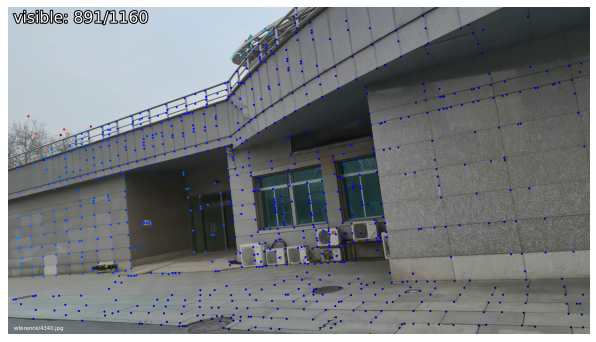

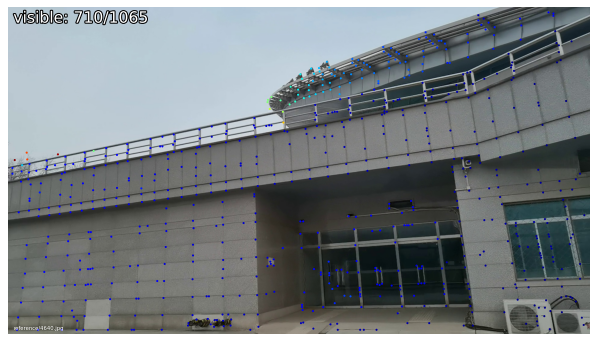

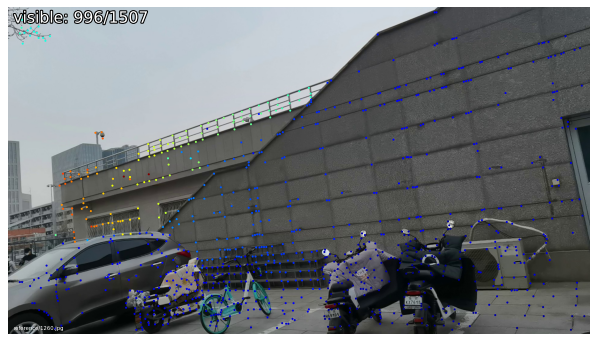

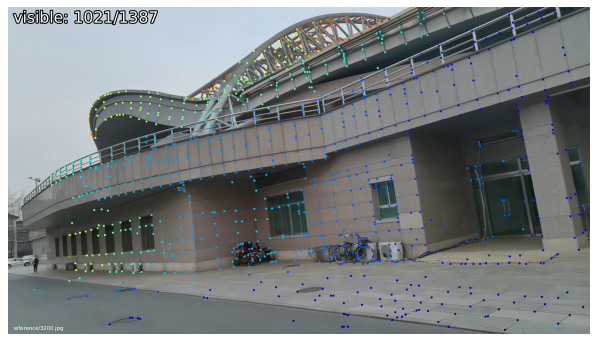

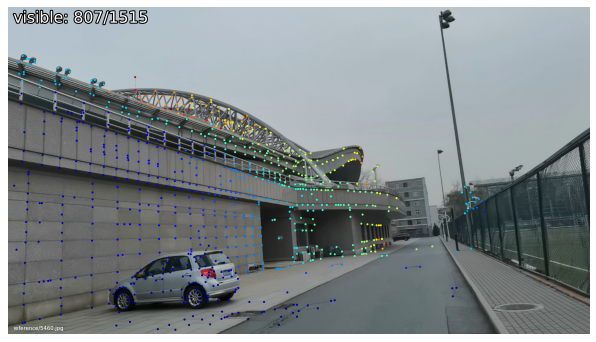

In [23]:
visualization.visualize_sfm_2d(model, sfm_dataset, color_by='depth', n=5)

## 查询图像定位

In [5]:
# 通过图像检索寻找查询图像与参考图像之间的图像对
extract_features.main(retrieval_conf, sfm_dataset, image_list=query_names, feature_path=retrieval, overwrite=True)
pairs_from_retrieval.main(retrieval, loc_pairs, num_matched=20, db_list=reference_names, query_list=query_names)

[2022/12/22 15:11:52 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
100%|██████████| 7/7 [00:01<00:00,  4.35it/s]
[2022/12/22 15:11:58 hloc INFO] Finished exporting features.
[2022/12/22 15:11:58 hloc INFO] Extracting image pairs from a retrieval database.
[2022/12/22 15:11:59 hloc INFO] Found 140 pairs.


In [6]:
# 提取并匹配局部特征
extract_features.main(feature_conf, sfm_dataset, image_list=query_names, feature_path=features, overwrite=True)
match_features.main(matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True)

[2022/12/22 15:12:02 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


100%|██████████| 7/7 [00:00<00:00, 15.09it/s]
[2022/12/22 15:12:03 hloc INFO] Finished exporting features.
[2022/12/22 15:12:03 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 140/140 [00:24<00:00,  5.76it/s]
[2022/12/22 15:12:27 hloc INFO] Finished exporting matches.


PosixPath('datasets/SportsHall/hloc/matches.h5')

In [9]:
# 提取查询图像的特征，并与参考图像穷举匹配
# pairs_from_exhaustive.main(loc_pairs, image_list=query_names, ref_list=reference_names)
# match_features.main(matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True)

In [12]:
# 定位查询图像，估计相机位姿并优化相机参数
model = pycolmap.Reconstruction(sfm_dir)  # 加载三维重建模型

config = {  # QueryLocalizer 的参数配置
    'estimation': {'ransac': {'max_error': 12}},
    'refinement': {'refine_focal_length': True, 'refine_extra_params': True},
}
options = {
    'camera_model': 'PINHOLE',
    # 'camera_params': ''
}

poses, cameras, logs = localize_sfm.main2(sfm_dataset, model, query_names, loc_pairs, features, matches, loc_results, options=options, config=config)
for qname in query_names:  # 返回参数内容
    print(logs.keys())
    print(logs['loc'][qname].keys())
    print(logs['loc'][qname]['PnP_ret'].keys())  # 与 pose_from_cluster 的 ret 相同
    break

[2022/12/23 14:42:55 hloc INFO] Reading the 3D model...
[2022/12/23 14:42:55 hloc INFO] Starting localization...
7it [00:00, 12.41it/s]
[2022/12/23 14:42:56 hloc INFO] Localized 7 / 7 images.
[2022/12/23 14:42:56 hloc INFO] Writing poses to datasets/SportsHall/hloc/SportsHall_hloc_superpoint+superglue_netvlad20.txt...
[2022/12/23 14:42:56 hloc INFO] Writing logs to datasets/SportsHall/hloc/SportsHall_hloc_superpoint+superglue_netvlad20.txt_logs.pkl...
[2022/12/23 14:42:56 hloc INFO] Done!


dict_keys(['features', 'matches', 'retrieval', 'loc'])
dict_keys(['db', 'PnP_ret', 'keypoints_query', 'points3D_ids', 'points3D_xyz', 'num_matches', 'keypoint_index_to_db', 'covisibility_clustering', 'inlier_rate'])
dict_keys(['success', 'qvec', 'tvec', 'num_inliers', 'inliers', 'camera'])


In [13]:
# 保存查询图像名称和估计的相机参数
with open(query_intrinsics, 'w') as f:
    for i, qname in enumerate(query_names):
        qcam = cameras[qname]
        params = " ".join(str(c) for c in qcam.params)
        f.write(f'{qname} {qcam.model_name} {qcam.width} {qcam.height} {params}\n')

In [9]:
# 定位结果3D可视化
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping", cameras=False)  # 可视化sfm模型
for i, qname in enumerate(query_names):
    viz_3d.plot_camera_colmap(fig, poses[qname], cameras[qname], color='rgba(0,255,0,0.5)', name=i)  # 可视化查询图像相机位姿
fig.show()

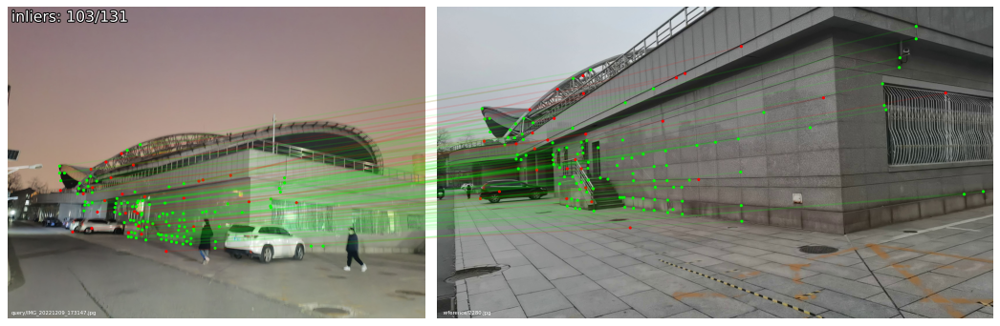

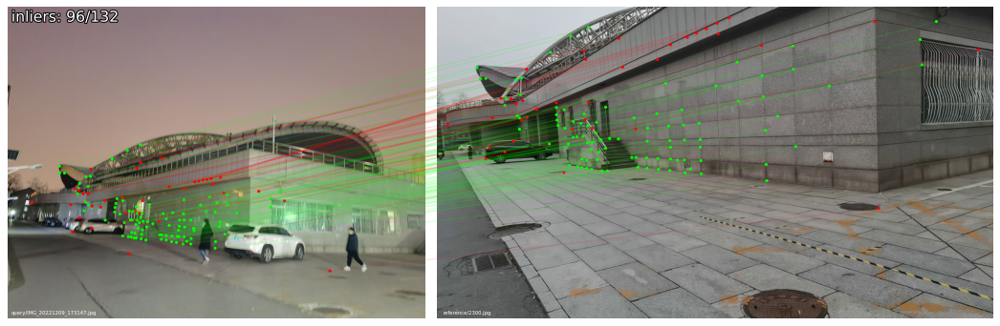

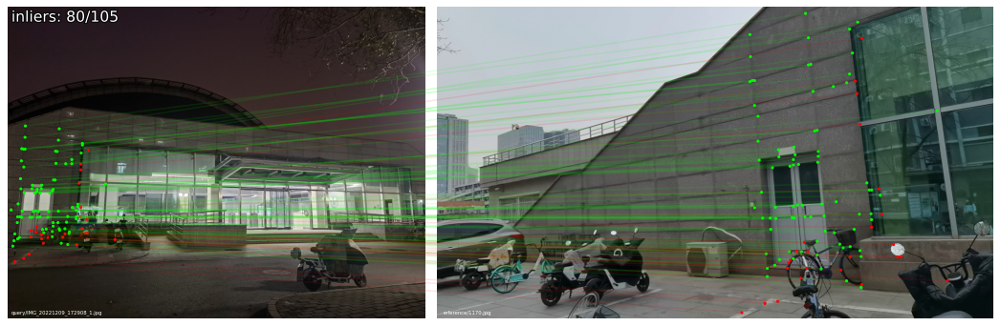

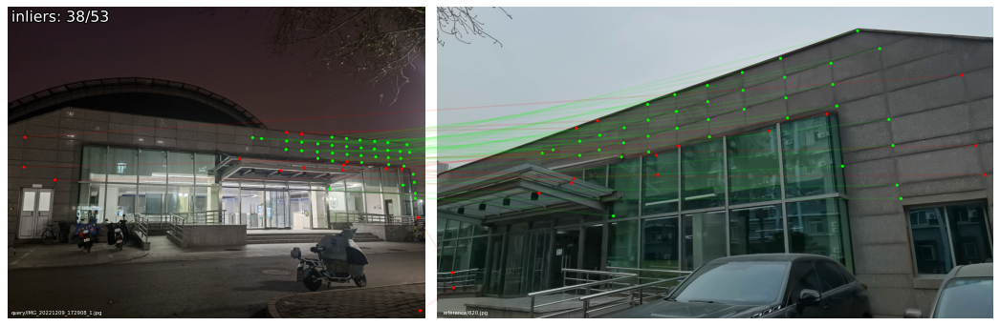

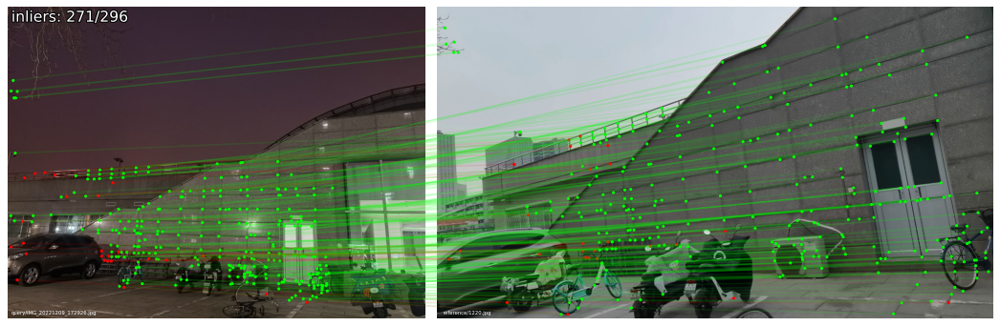

...

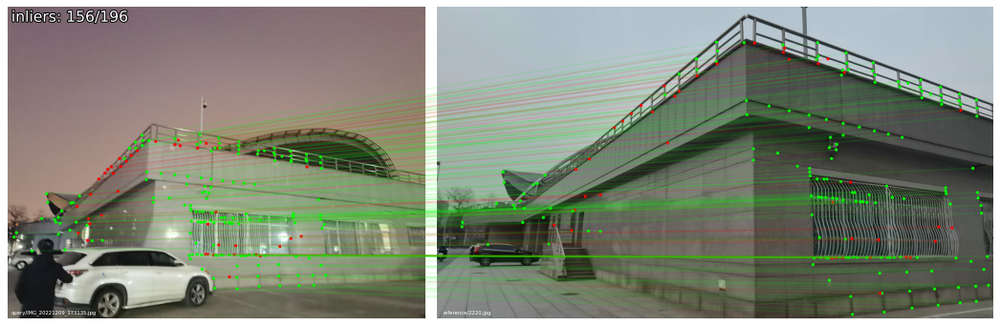

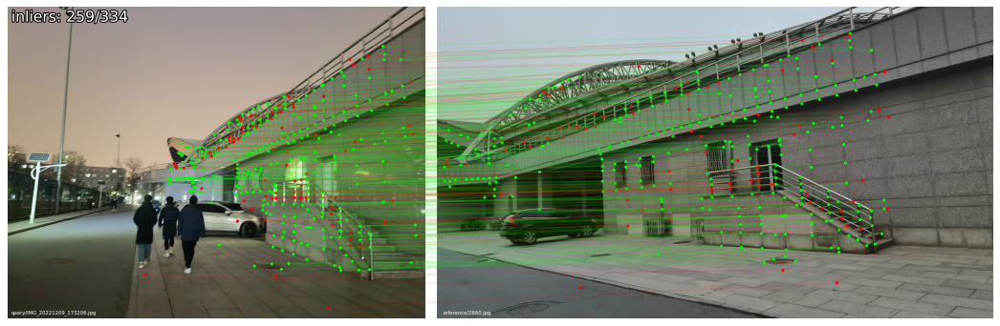

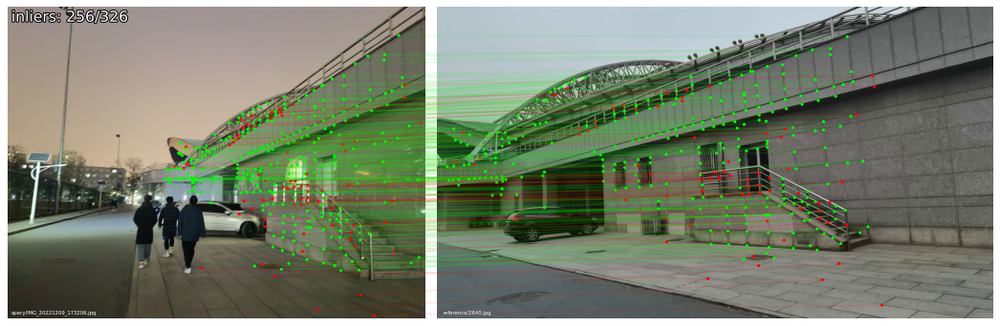

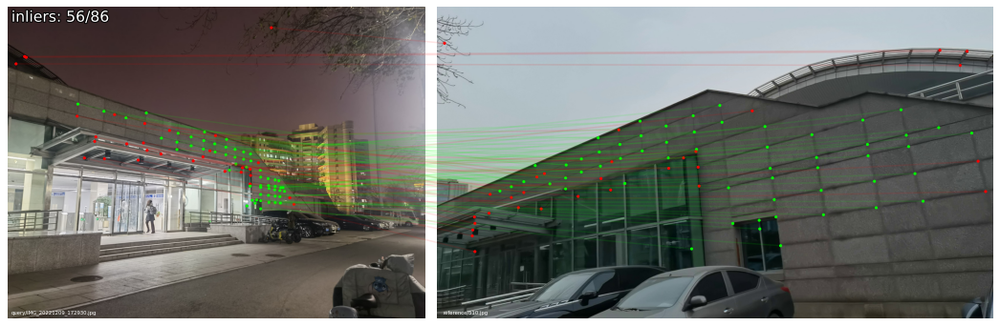

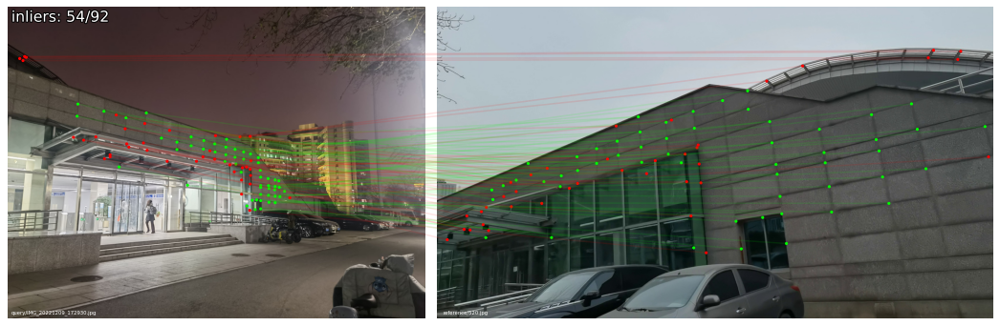

In [11]:
# 定位结果2D可视化
for query in query_names:
    visualization.visualize_loc_from_log(sfm_dataset, query, logs['loc'][query], model)


## 相对位姿估计

In [28]:
rel_results = outputs / 'relative_poses.txt'  # the result file
intrinsics = [reference_intrinsics, query_intrinsics]
logs = relative_pose.main(sfm_dataset, intrinsics, sfm_pairs, features, matches, rel_results)


[2022/12/23 15:22:07 hloc.utils.parsers INFO] Imported 295 images from reference_with_intrinsics.txt
[2022/12/23 15:22:07 hloc.utils.parsers INFO] Imported 302 images from query_with_intrinsics.txt
[2022/12/23 15:22:07 hloc INFO] Start two view geometry estimation...
 58%|█████▊    | 170/295 [01:43<01:01,  2.04it/s][2022/12/23 15:23:51 hloc WARNING] reference/4540.jpg and reference/3680.jpg estimate failed. Skipping...
[2022/12/23 15:23:51 hloc WARNING] reference/4540.jpg and reference/3660.jpg estimate failed. Skipping...
100%|██████████| 295/295 [02:56<00:00,  1.67it/s]
[2022/12/23 15:25:04 hloc INFO] Estimation success / failed: 1468 / 7
[2022/12/23 15:25:04 hloc INFO] Writing relative poses estimation to datasets/SportsHall/hloc/relative_poses.txt...


In [74]:
name1 = 'reference/2420.jpg'
name2 = 'reference/2380.jpg'
img1 = model.find_image_with_name(name1)
img2 = model.find_image_with_name(name2)
cam1 = model.cameras[img1.camera_id]
cam2 = model.cameras[img2.camera_id]
homo = np.array([0, 0, 0, 1])

qvec_1_2, tvec_1_2 = pycolmap.relative_pose(img1.qvec, img1.tvec, img2.qvec, img2.tvec)
print(qvec_1_2, tvec_1_2, qvec_1_2.dtype)

R_1_2 = pycolmap.qvec_to_rotmat(qvec_1_2)
P_1_2 = np.reshape(tvec_1_2, (3,1))
T_1_2 = np.hstack([R_1_2, P_1_2])
T_1_2 = np.vstack([T_1_2, homo])
print(T_1_2)

[ 0.9927968   0.09914296 -0.06696066 -0.0064384 ] [-0.09122905 -0.00233635 -0.03230749] float64
[[ 9.90949635e-01 -4.93317754e-04 -1.34233295e-01 -9.12290477e-02]
 [-2.60613925e-02  9.80258442e-01 -1.95995385e-01 -2.33634975e-03]
 [ 1.31680008e-01  1.97719861e-01  9.71373889e-01 -3.23074920e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [88]:
evaluate.main(rel_results, reference_poses, False)

[2022/12/23 19:50:54 hloc INFO] Start evaluate relative poses estimation...
100%|██████████| 295/295 [00:00<00:00, 5122.08it/s]
[2022/12/23 19:50:54 hloc INFO] Mean errors: 0.792deg, 0.060unit
[2022/12/23 19:50:54 hloc INFO] Median errors: 0.166deg, 0.017unit
[2022/12/23 19:50:54 hloc INFO] Max errors: 166.635deg, 2.000unit
[2022/12/23 19:50:54 hloc INFO] 0.1deg : 26.63%
[2022/12/23 19:50:54 hloc INFO] 0.2deg : 58.58%
[2022/12/23 19:50:54 hloc INFO] 0.5deg : 89.10%
[2022/12/23 19:50:54 hloc INFO] 1.0deg : 96.19%
[2022/12/23 19:50:54 hloc INFO] 2.0deg : 97.68%
[2022/12/23 19:50:54 hloc INFO] 3.0deg : 97.96%
[2022/12/23 19:50:54 hloc INFO] 5.0deg : 98.77%
[2022/12/23 19:50:54 hloc INFO] 10.0deg : 99.05%
[2022/12/23 19:50:54 hloc INFO] 0.010unit : 30.79%
[2022/12/23 19:50:54 hloc INFO] 0.020unit : 56.54%
[2022/12/23 19:50:54 hloc INFO] 0.030unit : 73.16%
[2022/12/23 19:50:54 hloc INFO] 0.050unit : 86.04%
[2022/12/23 19:50:54 hloc INFO] 0.100unit : 93.87%
[2022/12/23 19:50:54 hloc INFO] 0.